# Task 3 — Part A: Pool Ball Detection

**Goal:** Train an object detector that can locate every ball on a pool table, draw a bounding box around it, and label it with its category (`Black`, `Cue`, `Dot`, `Solid`, `Striped`).

**What we will build:**
1. Explore and understand the dataset (images + COCO annotations)
2. Convert the dataset to YOLO format (what the models expect)
3. Fine-tune **YOLOv8-s** — a fast, CNN-based single-stage detector
4. Fine-tune **RT-DETR-l** — a modern Transformer-based detector
5. Compare both models on standard detection metrics (mAP, precision, recall, speed)



---
## 0. Install Dependencies

We only need one library: **Ultralytics**, which packages YOLOv8 and RT-DETR under a single, clean API. It also handles data augmentation, logging, and evaluation automatically.

In [4]:
!pip install ultralytics --quiet


[notice] A new release of pip available: 22.3.1 -> 26.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [5]:
import os
import json
import shutil
import random
from pathlib import Path
from collections import Counter

import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches

from ultralytics import YOLO, RTDETR

random.seed(42)
np.random.seed(42)

print("All imports successful!")

All imports successful!


---
## 1. Data Exploration

Before touching a model, always explore your data. We want to answer:
- How many images and annotations do we have?
- What categories exist, and how are they distributed?
- What do the images and ground-truth boxes look like?

Our dataset lives in `./train/` and uses **COCO JSON format**. In COCO:
- `images` → list of image metadata (id, file_name, width, height)
- `categories` → list of class names and their integer ids
- `annotations` → list of bounding boxes, each linked to an image and a category

In [6]:
# ── Paths ──────────────────────────────────────────────────────────────────
TRAIN_DIR   = Path("./train")
COCO_JSON   = TRAIN_DIR / "_annotations.coco.json"

# ── Load the COCO JSON ─────────────────────────────────────────────────────
with open(COCO_JSON) as f:
    coco = json.load(f)

print(f"Total images      : {len(coco['images'])}")
print(f"Total annotations : {len(coco['annotations'])}")
print(f"\nCategories:")
for cat in coco["categories"]:
    print(f"  id={cat['id']:>3}  name={cat['name']}")

Total images      : 247
Total annotations : 7244

Categories:
  id=  0  name=balls
  id=  1  name=Black
  id=  2  name=Cue
  id=  3  name=Dot
  id=  4  name=Solid
  id=  5  name=Striped


In [7]:
# ── Build helper look-up dictionaries ──────────────────────────────────────
id_to_name = {cat["id"]: cat["name"] for cat in coco["categories"]}

id_to_file = {img["id"]: img["file_name"] for img in coco["images"]}

# ── Count annotations per category ─────────────────────────────────────────
real_cat_ids = {cat["id"] for cat in coco["categories"] if cat["name"] != "balls"}

cat_counts = Counter(
    id_to_name[ann["category_id"]]
    for ann in coco["annotations"]
    if ann["category_id"] in real_cat_ids
)

print("Annotation counts per class:")
for name, count in sorted(cat_counts.items(), key=lambda x: -x[1]):
    print(f"  {name:<10}: {count}")

# ── Bar chart ──────────────────────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(7, 4))
ax.bar(cat_counts.keys(), cat_counts.values(), color="steelblue", edgecolor="white")
ax.set_title("Number of annotations per ball category")
ax.set_ylabel("Count")
ax.set_xlabel("Category")
plt.tight_layout()
plt.show()

Annotation counts per class:
  Dot       : 4427
  Solid     : 1225
  Striped   : 1105
  Cue       : 245
  Black     : 242


C:\Users\Ethan\AppData\Local\Temp\ipykernel_26092\4110013222.py:26: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plt.show()


In [8]:
# ── Visualise ground-truth boxes on a few sample images ────────────────────

ann_by_img = {}
for ann in coco["annotations"]:
    if ann["category_id"] not in real_cat_ids:
        continue
    ann_by_img.setdefault(ann["image_id"], []).append(ann)

PALETTE = {
    "Black"  : "#111111",
    "Cue"    : "#f5f5f5",
    "Dot"    : "#e63946",
    "Solid"  : "#2196f3",
    "Striped": "#ff9800",
}

sample_ids = random.sample(list(ann_by_img.keys()), k=4)

fig, axes = plt.subplots(2, 2, figsize=(14, 10))
for ax, img_id in zip(axes.flat, sample_ids):
    img_path = TRAIN_DIR / id_to_file[img_id]
    img_bgr  = cv2.imread(str(img_path))
    img_rgb  = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    ax.imshow(img_rgb)

    for ann in ann_by_img[img_id]:
        x, y, w, h = ann["bbox"]
        cat_name   = id_to_name[ann["category_id"]]
        color      = PALETTE.get(cat_name, "lime")
        rect = patches.Rectangle(
            (x, y), w, h,
            linewidth=2, edgecolor=color, facecolor="none"
        )
        ax.add_patch(rect)
        ax.text(x, y - 4, cat_name, color=color, fontsize=8,
                bbox=dict(facecolor="black", alpha=0.4, pad=1))

    ax.set_title(f"Image id {img_id}", fontsize=10)
    ax.axis("off")

plt.suptitle("Ground-truth bounding boxes (sample)", fontsize=13)
plt.tight_layout()
plt.show()

C:\Users\Ethan\AppData\Local\Temp\ipykernel_26092\830931344.py:43: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plt.show()


---
## 2. Data Preparation: COCO → YOLO Format

Ultralytics models expect data in **YOLO format**, which is different from COCO:

| Format | Annotation file | Box representation |
|--------|----------------|--------------------|
| COCO   | One big JSON   | `[x_min, y_min, width, height]` in pixels |
| YOLO   | One `.txt` per image | `[class_id, x_center, y_center, width, height]` **normalised 0–1** |

We also need to **create train/val/test splits** ourselves (our dataset has no pre-made splits).

**Split strategy:** 70% train / 15% val / 15% test, stratified at the image level.

In [10]:
# ── 2.1  Map category name → 0-indexed YOLO class id ───────────────────────
CLASS_NAMES  = sorted([cat["name"] for cat in coco["categories"]
                       if cat["name"] != "balls"])
name_to_yolo = {name: idx for idx, name in enumerate(CLASS_NAMES)}
print("YOLO class mapping:", name_to_yolo)

YOLO class mapping: {'Black': 0, 'Cue': 1, 'Dot': 2, 'Solid': 3, 'Striped': 4}


In [11]:
# ── 2.2  Create the directory structure expected by Ultralytics ─────────────

DATASET_DIR = Path("./dataset")

for split in ["train", "val", "test"]:
    (DATASET_DIR / "images" / split).mkdir(parents=True, exist_ok=True)
    (DATASET_DIR / "labels" / split).mkdir(parents=True, exist_ok=True)

print("Directory structure created.")

Directory structure created.


In [12]:
# ── 2.3  Split image ids into train / val / test ────────────────────────────
all_img_ids = sorted(ann_by_img.keys())
random.shuffle(all_img_ids)

n       = len(all_img_ids)
n_train = int(0.70 * n)
n_val   = int(0.15 * n)

splits = {
    "train": all_img_ids[:n_train],
    "val"  : all_img_ids[n_train : n_train + n_val],
    "test" : all_img_ids[n_train + n_val :],
}

for split, ids in splits.items():
    print(f"{split:>5}: {len(ids):>4} images")

train:  172 images
  val:   37 images
 test:   38 images


In [13]:
# ── 2.4  Convert annotations and copy images ────────────────────────────────

img_dims = {img["id"]: (img["width"], img["height"]) for img in coco["images"]}

def coco_bbox_to_yolo(bbox, img_w, img_h):
    """Convert COCO [x_min, y_min, w, h] to YOLO [xc, yc, w, h] normalised."""
    x_min, y_min, w, h = bbox
    x_center = (x_min + w / 2) / img_w
    y_center = (y_min + h / 2) / img_h
    return x_center, y_center, w / img_w, h / img_h

for split, img_ids in splits.items():
    for img_id in img_ids:
        img_info  = next(img for img in coco["images"] if img["id"] == img_id)
        fname     = img_info["file_name"]
        img_w, img_h = img_dims[img_id]

        src = TRAIN_DIR / fname
        dst = DATASET_DIR / "images" / split / fname
        shutil.copy(src, dst)

        label_path = DATASET_DIR / "labels" / split / (Path(fname).stem + ".txt")
        lines = []
        for ann in ann_by_img.get(img_id, []):
            cat_name = id_to_name[ann["category_id"]]
            class_id = name_to_yolo[cat_name]
            xc, yc, w, h = coco_bbox_to_yolo(ann["bbox"], img_w, img_h)
            xc = max(0.0, min(1.0, xc))
            yc = max(0.0, min(1.0, yc))
            w  = max(0.0, min(1.0, w))
            h  = max(0.0, min(1.0, h))
            lines.append(f"{class_id} {xc:.6f} {yc:.6f} {w:.6f} {h:.6f}")

        label_path.write_text("\n".join(lines))

print("Dataset converted and organised successfully!")

Dataset converted and organised successfully!


In [14]:
# ── 2.5  Write the YAML config file ────────────────────────────────────────

yaml_content = f"""# Pool Ball Detection Dataset
path: {DATASET_DIR.resolve()}

train: images/train
val:   images/val
test:  images/test

nc: {len(CLASS_NAMES)}
names: {CLASS_NAMES}
"""

yaml_path = Path("pool_balls.yaml")
yaml_path.write_text(yaml_content)
print(yaml_path.read_text())

# Pool Ball Detection Dataset
path: D:\FEUP\AI\Computer vision\CV-TASK2-3\dataset

train: images/train
val:   images/val
test:  images/test

nc: 5
names: ['Black', 'Cue', 'Dot', 'Solid', 'Striped']



---
## 3. Model Training



In [15]:
EPOCHS    = 20
IMG_SIZE  = 640
BATCH     = 8
DATA_YAML = str(yaml_path.resolve())

print(f"Training config: epochs={EPOCHS}, imgsz={IMG_SIZE}, batch={BATCH}")

Training config: epochs=20, imgsz=640, batch=8


In [13]:
# ── 3.1  Train YOLOv8-s ─────────────────────────────────────────────────────

print("=" * 60)
print("Training YOLOv8-s...")
print("=" * 60)

yolo_model = YOLO("yolov8s.pt")

yolo_results = yolo_model.train(
    data    = DATA_YAML,  
    epochs  = EPOCHS,
    imgsz   = IMG_SIZE,
    batch   = BATCH,
    name    = "yolov8s_pool",
    exist_ok= True,
    verbose = False,
    workers = 0,
)

print("\nYOLOv8-s training complete!")

Training YOLOv8-s...
New https://pypi.org/project/ultralytics/8.4.77 available  Update with 'pip install -U ultralytics'
Ultralytics 8.4.60  Python-3.11.1 torch-2.12.0.dev20260408+cu128 CUDA:0 (NVIDIA GeForce RTX 5060 Laptop GPU, 8151MiB)
engine\trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=D:\FEUP\AI\Computer vision\CV-TASK2-3\pool_balls.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=20, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode

In [14]:
# ── 3.2  Train RT-DETR-l ────────────────────────────────────────────────────

print("=" * 60)
print("Training RT-DETR-l...")
print("=" * 60)

rtdetr_model = RTDETR("rtdetr-l.pt")

rtdetr_results = rtdetr_model.train(
    data    = DATA_YAML,
    epochs  = EPOCHS,
    imgsz   = IMG_SIZE,
    batch   = 2,
    name    = "rtdetr_pool",
    exist_ok= True,
    verbose = False,
    workers = 0,
)

print("\nRT-DETR-l training complete!")

Training RT-DETR-l...
New https://pypi.org/project/ultralytics/8.4.77 available  Update with 'pip install -U ultralytics'
Ultralytics 8.4.60  Python-3.11.1 torch-2.12.0.dev20260408+cu128 CUDA:0 (NVIDIA GeForce RTX 5060 Laptop GPU, 8151MiB)
engine\trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=2, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=D:\FEUP\AI\Computer vision\CV-TASK2-3\pool_balls.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=20, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mod

c:\Users\Ethan\AppData\Local\Programs\Python\Python311\Lib\site-packages\torch\autograd\graph.py:882: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\aten\src\ATen\Context.cpp:164.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       1/20      6.13G      2.663     0.3586      1.226          2       1280: 100% ━━━━━━━━━━━━ 86/86 1.3s/it 1:551.3sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 1.4s/it 14.3s4ss
                   all         37       1106      0.104      0.341      0.124     0.0475

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       2/20      6.44G       2.08     0.3582     0.3428          2       1280: 0% ──────────── 0/86  2.1s

c:\Users\Ethan\AppData\Local\Programs\Python\Python311\Lib\site-packages\torch\autograd\graph.py:882: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\aten\src\ATen\Context.cpp:164.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       2/20      6.44G      1.591       0.44     0.3022          2       1280: 100% ━━━━━━━━━━━━ 86/86 1.4s/it 1:571.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 2.5it/s 4.0s.4ss
                   all         37       1106      0.545      0.358      0.207      0.102

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       3/20      6.47G      1.296      0.507     0.2411          2       1280: 0% ──────────── 0/86  1.8s

c:\Users\Ethan\AppData\Local\Programs\Python\Python311\Lib\site-packages\torch\autograd\graph.py:882: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\aten\src\ATen\Context.cpp:164.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       3/20      6.47G      1.512     0.4306     0.2854          2       1280: 100% ━━━━━━━━━━━━ 86/86 1.5s/it 2:111.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 2.2it/s 4.6s.5ss
                   all         37       1106      0.552      0.354      0.293      0.145

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


c:\Users\Ethan\AppData\Local\Programs\Python\Python311\Lib\site-packages\torch\autograd\graph.py:882: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\aten\src\ATen\Context.cpp:164.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       4/20      6.43G      1.706     0.3043     0.2748          2       1280: 100% ━━━━━━━━━━━━ 86/86 1.4s/it 1:561.0sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 3.9it/s 2.5s.3s
                   all         37       1106      0.171      0.691      0.281      0.143

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       5/20      6.44G      1.739     0.2958     0.1636          2       1280: 0% ──────────── 0/86  1.4s

c:\Users\Ethan\AppData\Local\Programs\Python\Python311\Lib\site-packages\torch\autograd\graph.py:882: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\aten\src\ATen\Context.cpp:164.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       5/20      6.44G      1.969     0.2193     0.3996          2       1280: 100% ━━━━━━━━━━━━ 86/86 1.1s/it 1:361.1sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 2.9it/s 3.5s.4ss
                   all         37       1106       0.26      0.698       0.34      0.171

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       6/20      6.45G      1.873     0.2777     0.6776          2       1280: 0% ──────────── 0/86  1.3s

c:\Users\Ethan\AppData\Local\Programs\Python\Python311\Lib\site-packages\torch\autograd\graph.py:882: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\aten\src\ATen\Context.cpp:164.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       6/20      6.45G      1.934     0.2282     0.4754          2       1280: 100% ━━━━━━━━━━━━ 86/86 1.1s/it 1:351.0sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 3.6it/s 2.8s.3s
                   all         37       1106      0.371      0.631      0.445      0.238

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       7/20      6.47G       1.96     0.1953     0.5877          2       1280: 0% ──────────── 0/86  0.9s

c:\Users\Ethan\AppData\Local\Programs\Python\Python311\Lib\site-packages\torch\autograd\graph.py:882: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\aten\src\ATen\Context.cpp:164.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       7/20      6.47G      1.695     0.2566     0.3092          2       1280: 100% ━━━━━━━━━━━━ 86/86 1.1s/it 1:341.4sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 2.4it/s 4.2s.4ss
                   all         37       1106      0.377      0.618      0.421      0.202

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       8/20      6.38G      2.184     0.1868     0.6978          2       1280: 0% ──────────── 0/86  1.5s

c:\Users\Ethan\AppData\Local\Programs\Python\Python311\Lib\site-packages\torch\autograd\graph.py:882: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\aten\src\ATen\Context.cpp:164.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       8/20      6.38G      1.569     0.2787     0.2553          2       1280: 100% ━━━━━━━━━━━━ 86/86 1.4s/it 2:041.5ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 2.7it/s 3.7s.4ss
                   all         37       1106      0.358      0.636       0.44      0.261

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       9/20      6.43G       2.22     0.1547     0.6559          2       1280: 0% ──────────── 0/86  1.5s

c:\Users\Ethan\AppData\Local\Programs\Python\Python311\Lib\site-packages\torch\autograd\graph.py:882: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\aten\src\ATen\Context.cpp:164.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       9/20      6.43G      1.604     0.2507     0.2617          2       1280: 100% ━━━━━━━━━━━━ 86/86 1.4s/it 2:041.5ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 1.9it/s 5.2s.6ss
                   all         37       1106      0.361      0.671      0.502      0.312

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      10/20      6.37G        1.6     0.2641     0.2544          2       1280: 0% ──────────── 0/86  2.0s

c:\Users\Ethan\AppData\Local\Programs\Python\Python311\Lib\site-packages\torch\autograd\graph.py:882: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\aten\src\ATen\Context.cpp:164.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      10/20      6.37G      1.501     0.2802      0.207          2       1280: 100% ━━━━━━━━━━━━ 86/86 1.5s/it 2:121.4ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 2.1it/s 4.8s.5ss
                   all         37       1106      0.412      0.665      0.519      0.352
Closing dataloader mosaic

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      11/20      2.38G     0.8726      0.534    0.05996          2        640: 0% ──────────── 0/86  8.7s

c:\Users\Ethan\AppData\Local\Programs\Python\Python311\Lib\site-packages\torch\autograd\graph.py:882: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\aten\src\ATen\Context.cpp:164.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      11/20      2.38G     0.9695     0.5266    0.08576          2        640: 100% ━━━━━━━━━━━━ 86/86 1.3s/it 1:521.5sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 2.1it/s 4.8s.4ss
                   all         37       1106      0.498      0.576      0.567        0.4

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      12/20      2.38G     0.7689     0.6786     0.0371          2        640: 0% ──────────── 0/86  1.6s

c:\Users\Ethan\AppData\Local\Programs\Python\Python311\Lib\site-packages\torch\autograd\graph.py:882: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\aten\src\ATen\Context.cpp:164.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      12/20      2.38G     0.8768     0.6319    0.06885          2        640: 100% ━━━━━━━━━━━━ 86/86 1.1it/s 1:170.9sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 3.6it/s 2.8s.3s
                   all         37       1106      0.338      0.748      0.419      0.275

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      13/20      2.38G     0.6607     0.7321    0.04315          2        640: 0% ──────────── 0/86  0.8s

c:\Users\Ethan\AppData\Local\Programs\Python\Python311\Lib\site-packages\torch\autograd\graph.py:882: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\aten\src\ATen\Context.cpp:164.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      13/20      2.38G     0.6855      0.674    0.03515          2        640: 100% ━━━━━━━━━━━━ 86/86 1.1it/s 1:190.9sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 3.2it/s 3.1s.4s
                   all         37       1106      0.479      0.736      0.597      0.435

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      14/20      2.38G     0.5813     0.7441    0.03132          2        640: 0% ──────────── 0/86  1.0s

c:\Users\Ethan\AppData\Local\Programs\Python\Python311\Lib\site-packages\torch\autograd\graph.py:882: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\aten\src\ATen\Context.cpp:164.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      14/20      2.38G     0.6409     0.6076    0.03103          2        640: 100% ━━━━━━━━━━━━ 86/86 1.0it/s 1:230.8sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 3.2it/s 3.1s.4s
                   all         37       1106      0.376       0.75        0.5      0.361

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      15/20      2.38G     0.7077     0.6034    0.04407          2        640: 0% ──────────── 0/86  1.0s

c:\Users\Ethan\AppData\Local\Programs\Python\Python311\Lib\site-packages\torch\autograd\graph.py:882: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\aten\src\ATen\Context.cpp:164.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      15/20      2.38G     0.6249     0.6493    0.02806          2        640: 100% ━━━━━━━━━━━━ 86/86 1.2it/s 1:140.9sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 4.2it/s 2.4s.3s
                   all         37       1106      0.351        0.8      0.528       0.38

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      16/20      2.38G     0.6602     0.5758    0.03373          2        640: 0% ──────────── 0/86  1.1s

c:\Users\Ethan\AppData\Local\Programs\Python\Python311\Lib\site-packages\torch\autograd\graph.py:882: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\aten\src\ATen\Context.cpp:164.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      16/20      2.38G     0.6236     0.6109    0.02867          2        640: 100% ━━━━━━━━━━━━ 86/86 1.1it/s 1:190.9sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 4.2it/s 2.4s.3s
                   all         37       1106      0.516      0.833      0.705      0.527

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      17/20      2.38G      0.523     0.6355    0.02002          2        640: 0% ──────────── 0/86  0.8s

c:\Users\Ethan\AppData\Local\Programs\Python\Python311\Lib\site-packages\torch\autograd\graph.py:882: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\aten\src\ATen\Context.cpp:164.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      17/20      2.38G     0.5998     0.5737    0.02432          2        640: 100% ━━━━━━━━━━━━ 86/86 1.4it/s 1:030.6sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 5.0it/s 2.0s.2s
                   all         37       1106      0.616      0.849       0.78      0.578

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      18/20      2.38G     0.4777      0.571    0.01463          2        640: 0% ──────────── 0/86  0.9s

c:\Users\Ethan\AppData\Local\Programs\Python\Python311\Lib\site-packages\torch\autograd\graph.py:882: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\aten\src\ATen\Context.cpp:164.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      18/20      2.38G     0.5831     0.5713    0.02505          2        640: 100% ━━━━━━━━━━━━ 86/86 1.1s/it 1:351.6sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 1.8it/s 5.7s.6ss
                   all         37       1106      0.598      0.843      0.795      0.588

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      19/20      2.38G     0.5612     0.5786    0.02998          2        640: 0% ──────────── 0/86  1.3s

c:\Users\Ethan\AppData\Local\Programs\Python\Python311\Lib\site-packages\torch\autograd\graph.py:882: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\aten\src\ATen\Context.cpp:164.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      19/20      2.38G     0.5805     0.5721     0.0249          2        640: 100% ━━━━━━━━━━━━ 86/86 1.3s/it 1:551.6sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 2.1it/s 4.7s.5ss
                   all         37       1106      0.609      0.871      0.814        0.6

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


c:\Users\Ethan\AppData\Local\Programs\Python\Python311\Lib\site-packages\torch\autograd\graph.py:882: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\aten\src\ATen\Context.cpp:164.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      20/20      2.38G     0.5937     0.5327    0.02407          2        640: 100% ━━━━━━━━━━━━ 86/86 1.3s/it 1:481.5sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 2.2it/s 4.6s.5ss
                   all         37       1106      0.663      0.869       0.84       0.61

20 epochs completed in 0.616 hours.
Optimizer stripped from D:\FEUP\AI\Computer vision\CV-TASK2-3\runs\detect\rtdetr_pool\weights\last.pt, 66.2MB
Optimizer stripped from D:\FEUP\AI\Computer vision\CV-TASK2-3\runs\detect\rtdetr_pool\weights\best.pt, 66.2MB

Validating D:\FEUP\AI\Computer vision\CV-TASK2-3\runs\detect\rtdetr_pool\weights\best.pt...
Ultralytics 8.4.60  Python-3.11.1 torch-2.12.0.dev20260408+cu128 CUDA:0 (NVIDIA GeForce RTX 5060 Laptop GPU, 8151MiB)
rt-detr-l summary: 310 layers, 31,994,015 parameters, 0 gradients, 103.5 GFLOPs
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10

---
## 4. Evaluation


### Key metrics explained

| Metric | Meaning | Range |
|--------|---------|-------|
| **Precision** | Of all boxes the model predicted, what fraction were correct? | 0–1, higher is better |
| **Recall** | Of all ground-truth boxes, what fraction did the model find? | 0–1, higher is better |
| **mAP@50** | Mean Average Precision at IoU ≥ 0.50 — the standard detection metric | 0–1, higher is better |
| **mAP@50:95** | Stricter: average mAP across IoU thresholds 0.50 to 0.95 | 0–1, higher is better |


In [16]:
# ── 4.1  Load best weights and run evaluation on test set ──────────────────

YOLO_BEST   = Path("runs/detect/yolov8s_pool/weights/best.pt")
RTDETR_BEST = Path("runs/detect/rtdetr_pool/weights/best.pt")

yolo_eval   = YOLO(str(YOLO_BEST))
rtdetr_eval = RTDETR(str(RTDETR_BEST))

print("Evaluating YOLOv8-s on test set...")
yolo_metrics = yolo_eval.val(data=DATA_YAML, split="test")

print("\nEvaluating RT-DETR-l on test set...")
rtdetr_metrics = rtdetr_eval.val(data=DATA_YAML, split="test")

Evaluating YOLOv8-s on test set...
Ultralytics 8.4.60  Python-3.11.1 torch-2.12.0.dev20260408+cu128 CUDA:0 (NVIDIA GeForce RTX 5060 Laptop GPU, 8151MiB)
Model summary (fused): 73 layers, 11,127,519 parameters, 0 gradients, 28.4 GFLOPs
val: Fast image access  (ping: 0.10.0 ms, read: 1041.6399.8 MB/s, size: 122.8 KB)
val: Scanning D:\FEUP\AI\Computer vision\CV-TASK2-3\dataset\labels\test.cache... 38 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 38/38  0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.2s/it 3.7s1.9ss
                   all         38       1068      0.878      0.868      0.917      0.692
                 Black         37         37      0.934      0.973      0.967      0.816
                   Cue         38         39      0.941      0.811      0.933      0.781
                   Dot         38        682      0.787      0.743      0.761      0.298
                 Solid         37        166     

In [17]:
# ── 4.2  Build the comparison table ────────────────────────────────────────

def extract_metrics(metrics):
    """Pull the core numbers out of an Ultralytics val result object."""
    return {
        "Precision"   : round(float(metrics.box.mp),   4),
        "Recall"      : round(float(metrics.box.mr),   4),
        "mAP@50"      : round(float(metrics.box.map50), 4),
        "mAP@50:95"   : round(float(metrics.box.map),  4),
    }

yolo_m   = extract_metrics(yolo_metrics)
rtdetr_m = extract_metrics(rtdetr_metrics)

print(f"{'Metric':<15} {'YOLOv8-s':>12} {'RT-DETR-l':>12}")
print("-" * 42)
for metric in ["Precision", "Recall", "mAP@50", "mAP@50:95"]:
    print(f"{metric:<15} {yolo_m[metric]:>12.4f} {rtdetr_m[metric]:>12.4f}")

Metric              YOLOv8-s    RT-DETR-l
------------------------------------------
Precision             0.8777       0.6344
Recall                0.8678       0.8840
mAP@50                0.9172       0.8447
mAP@50:95             0.6924       0.6300


In [18]:
# ── 4.3  Inference speed comparison ────────────────────────────────────────

import time

test_images = sorted((DATASET_DIR / "images" / "test").glob("*.jpg"))
sample_img  = str(test_images[0])
N_RUNS      = 20

def measure_speed(model, img_path, n_runs=20):
    model.predict(img_path, verbose=False)
    start = time.perf_counter()
    for _ in range(n_runs):
        model.predict(img_path, verbose=False)
    elapsed = time.perf_counter() - start
    return (elapsed / n_runs) * 1000

yolo_ms   = measure_speed(yolo_eval,   sample_img)
rtdetr_ms = measure_speed(rtdetr_eval, sample_img)

print(f"YOLOv8-s  inference speed : {yolo_ms:.1f} ms/image")
print(f"RT-DETR-l inference speed : {rtdetr_ms:.1f} ms/image")

YOLOv8-s  inference speed : 23.1 ms/image
RT-DETR-l inference speed : 47.7 ms/image


In [19]:
# ── 4.4  Visual comparison bar chart ───────────────────────────────────────

metrics_to_plot = ["Precision", "Recall", "mAP@50", "mAP@50:95"]
yolo_vals   = [yolo_m[m]   for m in metrics_to_plot]
rtdetr_vals = [rtdetr_m[m] for m in metrics_to_plot]

x     = np.arange(len(metrics_to_plot))
width = 0.35

fig, ax = plt.subplots(figsize=(9, 5))
bars1 = ax.bar(x - width/2, yolo_vals,   width, label="YOLOv8-s",  color="#2196f3")
bars2 = ax.bar(x + width/2, rtdetr_vals, width, label="RT-DETR-l", color="#ff9800")

ax.set_ylabel("Score")
ax.set_title("YOLOv8-s vs RT-DETR-l — Detection Metrics on Test Set")
ax.set_xticks(x)
ax.set_xticklabels(metrics_to_plot)
ax.set_ylim(0, 1.05)
ax.legend()
ax.bar_label(bars1, fmt="%.3f", padding=2, fontsize=8)
ax.bar_label(bars2, fmt="%.3f", padding=2, fontsize=8)

plt.tight_layout()
plt.show()

C:\Users\Ethan\AppData\Local\Temp\ipykernel_26092\1528195431.py:24: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plt.show()


---
## 5. Qualitative Results



In [20]:
# ── Visualise predictions on 4 test images for each model ──────────────────
import random 
CONF_THRESHOLD = 0.25

sample_test = random.sample(test_images, k=4)

fig, axes = plt.subplots(4, 2, figsize=(16, 22))

for row, img_path in enumerate(sample_test):
    for col, (model, model_name) in enumerate([
        (yolo_eval,   "YOLOv8-s"),
        (rtdetr_eval, "RT-DETR-l")
    ]):
        results = model.predict(str(img_path), conf=CONF_THRESHOLD, verbose=False)
        result  = results[0]

        plotted = result.plot()
        plotted = cv2.cvtColor(plotted, cv2.COLOR_BGR2RGB)

        axes[row, col].imshow(plotted)
        n_det = len(result.boxes)
        axes[row, col].set_title(f"{model_name} — {n_det} detections", fontsize=10)
        axes[row, col].axis("off")

plt.suptitle("Predictions on test images (Left: YOLOv8-s | Right: RT-DETR-l)",
             fontsize=13, y=1.01)
plt.tight_layout()
plt.show()

C:\Users\Ethan\AppData\Local\Temp\ipykernel_26092\2132701328.py:28: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plt.show()


---
## 6. Training Curves




In [35]:
import matplotlib
matplotlib.use("Agg")  # backend non-interactif, ne tente jamais d'ouvrir une fenêtre

import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

def find_col(df, keywords):
    for col in df.columns:
        col_lower = col.lower()
        if all(kw in col_lower for kw in keywords):
            return col
    return None

def plot_training_curves(run_dir, model_name, color, save_path):
    csv_path = Path(run_dir) / "results.csv"
    if not csv_path.exists():
        print(f"[{model_name}] results.csv introuvable")
        return

    df = pd.read_csv(csv_path)
    df.columns = df.columns.str.strip()

    train_box_col = find_col(df, ["train", "box"]) or find_col(df, ["train", "giou"]) or find_col(df, ["train", "bbox"])
    val_box_col   = find_col(df, ["val", "box"])   or find_col(df, ["val", "giou"])   or find_col(df, ["val", "bbox"])
    train_cls_col = find_col(df, ["train", "cls"])
    val_cls_col   = find_col(df, ["val", "cls"])
    map50_col     = find_col(df, ["map50"])

    fig, axes = plt.subplots(1, 3, figsize=(15, 4))
    fig.suptitle(f"{model_name} — Training Curves", fontsize=13)

    if train_box_col and val_box_col:
        axes[0].plot(df[train_box_col], label="Train", color=color)
        axes[0].plot(df[val_box_col], label="Val", ls="--", color=color, alpha=0.7)
        axes[0].set_title("Box loss"); axes[0].set_xlabel("Epoch"); axes[0].legend()

    if train_cls_col and val_cls_col:
        axes[1].plot(df[train_cls_col], label="Train", color=color)
        axes[1].plot(df[val_cls_col], label="Val", ls="--", color=color, alpha=0.7)
        axes[1].set_title("Class loss"); axes[1].set_xlabel("Epoch"); axes[1].legend()

    if map50_col:
        axes[2].plot(df[map50_col], color=color)
        axes[2].set_title("Val mAP@50"); axes[2].set_xlabel("Epoch")

    plt.tight_layout()
    plt.savefig(save_path, dpi=150)
    plt.close(fig)
    print(f"[{model_name}] Figure sauvegardée : {save_path}")

plot_training_curves("runs/detect/yolov8s_pool", "YOLOv8-s", "#2196f3", "yolo_curves.png")
plot_training_curves("runs/detect/rtdetr_pool", "RT-DETR-l", "#ff9800", "rtdetr_curves.png")

[YOLOv8-s] Figure sauvegardée : yolo_curves.png
[RT-DETR-l] Figure sauvegardée : rtdetr_curves.png


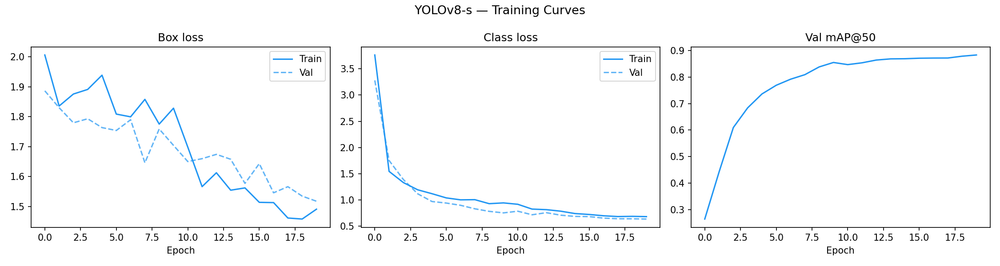

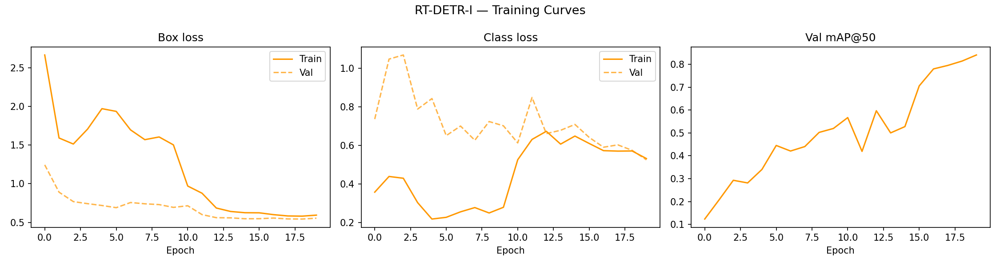

In [36]:
from IPython.display import Image, display
display(Image("yolo_curves.png"))
display(Image("rtdetr_curves.png"))

---
## 7. Per-Class Analysis


In [22]:

def per_class_ap(metrics, class_names):
    """Return a dict {class_name: AP@50} from a val result object."""
    ap50_per_class = metrics.box.ap50
    return {name: round(float(ap), 4)
            for name, ap in zip(class_names, ap50_per_class)}

yolo_per_class   = per_class_ap(yolo_metrics,   CLASS_NAMES)
rtdetr_per_class = per_class_ap(rtdetr_metrics, CLASS_NAMES)

print(f"{'Class':<10} {'YOLO AP@50':>12} {'RTDETR AP@50':>14}")
print("-" * 40)
for cls in CLASS_NAMES:
    print(f"{cls:<10} {yolo_per_class[cls]:>12.4f} {rtdetr_per_class[cls]:>14.4f}")

Class        YOLO AP@50   RTDETR AP@50
----------------------------------------
Black            0.9665         0.8135
Cue              0.9328         0.8658
Dot              0.7610         0.7455
Solid            0.9737         0.9264
Striped          0.9520         0.8724


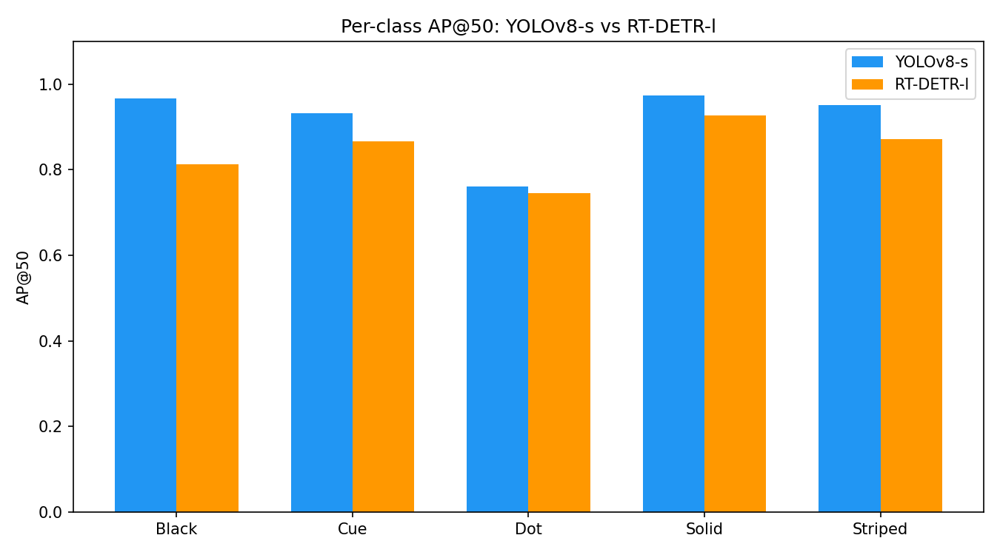

In [ ]:
# ── Per-class bar chart ─────────────────────────────────────────────────────
x     = np.arange(len(CLASS_NAMES))
width = 0.35
fig, ax = plt.subplots(figsize=(9, 5))
ax.bar(x - width/2, [yolo_per_class[c]   for c in CLASS_NAMES], width,
       label="YOLOv8-s",  color="#2196f3")
ax.bar(x + width/2, [rtdetr_per_class[c] for c in CLASS_NAMES], width,
       label="RT-DETR-l", color="#ff9800")
ax.set_ylabel("AP@50")
ax.set_title("Per-class AP@50: YOLOv8-s vs RT-DETR-l")
ax.set_xticks(x)
ax.set_xticklabels(CLASS_NAMES)
ax.set_ylim(0, 1.1)
ax.legend()
plt.tight_layout()
plt.savefig("per_class_ap50.png", dpi=150)
plt.close(fig)

display(Image("per_class_ap50.png"))

---
## 8. Summary 



In [24]:
print("=" * 55)
print("  TASK 3A — BALL DETECTION — RESULTS SUMMARY")
print("=" * 55)

print(f"\nDataset: {n} images  "
      f"(train={len(splits['train'])}, "
      f"val={len(splits['val'])}, "
      f"test={len(splits['test'])})")
print(f"Classes ({len(CLASS_NAMES)}): {', '.join(CLASS_NAMES)}")

print("\n--- Quantitative results (test set) ---")
print(f"{'Metric':<15} {'YOLOv8-s':>12} {'RT-DETR-l':>12}")
print("-" * 42)
for metric in ["Precision", "Recall", "mAP@50", "mAP@50:95"]:
    print(f"{metric:<15} {yolo_m[metric]:>12.4f} {rtdetr_m[metric]:>12.4f}")
print(f"{'Speed (ms/img)':<15} {yolo_ms:>12.1f} {rtdetr_ms:>12.1f}")

print("\n--- Per-class AP@50 ---")
print(f"{'Class':<10} {'YOLOv8-s':>10} {'RT-DETR-l':>12}")
print("-" * 35)
for cls in CLASS_NAMES:
    print(f"{cls:<10} {yolo_per_class[cls]:>10.4f} {rtdetr_per_class[cls]:>12.4f}")

print("\n" + "=" * 55)

  TASK 3A — BALL DETECTION — RESULTS SUMMARY

Dataset: 247 images  (train=172, val=37, test=38)
Classes (5): Black, Cue, Dot, Solid, Striped

--- Quantitative results (test set) ---
Metric              YOLOv8-s    RT-DETR-l
------------------------------------------
Precision             0.8777       0.6344
Recall                0.8678       0.8840
mAP@50                0.9172       0.8447
mAP@50:95             0.6924       0.6300
Speed (ms/img)          23.1         47.7

--- Per-class AP@50 ---
Class        YOLOv8-s    RT-DETR-l
-----------------------------------
Black          0.9665       0.8135
Cue            0.9328       0.8658
Dot            0.7610       0.7455
Solid          0.9737       0.9264
Striped        0.9520       0.8724



---
## Link: From Part A to Part B

Part B (table retrieval) is independent of Part A's trained detectors, it works directly on the raw images and builds its own ResNet-50 feature extractor. The only thing it needs from Part A is the dataset split (train/val/test), so that the retrieval gallery matches the same training images and the retrieval queries match the same held-out test images used to evaluate detection.

Part B's original code expects a `partition.csv` file with columns `image_name` and `partition` (`train` / `valid` / `test`). We generate that file here from the folder split already created in Section 2 of Part A, no need to re-run anything above, and no need to re-split the data differently.

In [25]:
# ── Generate partition.csv for Part B, reusing Part A's train/val/test split ──
import pandas as pd
from pathlib import Path

DATASET_DIR = Path("./dataset")

SPLIT_NAME_MAP = {"train": "train", "val": "valid", "test": "test"}

rows = []
for folder_split, partition_label in SPLIT_NAME_MAP.items():
    split_dir = DATASET_DIR / "images" / folder_split
    if not split_dir.exists():
        print(f"Warning: {split_dir} not found — did you run Part A, Section 2?")
        continue
    for img_path in sorted(split_dir.glob("*.jpg")):
        rows.append({"image_name": img_path.name, "partition": partition_label})

partition_df = pd.DataFrame(rows)
partition_csv_path = DATASET_DIR / "partition.csv"
partition_df.to_csv(partition_csv_path, index=False)

print(f"Wrote {len(partition_df)} rows to {partition_csv_path}")
print(partition_df["partition"].value_counts())

Wrote 247 rows to dataset\partition.csv
partition
train    172
test      38
valid     37
Name: count, dtype: int64


---

# Task 3, Part B: Table Retrieval

**Goal:** Given a query pool table image, retrieve the most visually similar image from the gallery (training set).



| Method | Feature | Metric |
|--------|---------|--------|
| **M1 — MSE (pixel-level)** | Raw pixels (resized) | Mean Squared Error | 
| **M2 — Pretrained ResNet-50** | 2048-d global avg-pool | MSE on features | 
| **M3 — Contrastive ResNet-50** | 2048-d trained features | MSE on features |




---
## 10. Data Setup

The retrieval **gallery** is the training partition (172 images, from Part A's split). The **queries** are the 38 held-out test images (same test set used to evaluate the detectors in Part A). We load both from `partition.csv`, generated in the bridge cell above.


In [47]:
# ── Imports ────────────────────────────────────────────────────────────────
import torch
import torchvision
import torchvision.transforms.v2 as T
import torchvision.transforms.functional as TF
from torch.nn import functional as F
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt
import os, random, re
from pathlib import Path
from collections import defaultdict
import pandas as pd
import numpy as np
from PIL import Image
from skimage.metrics import mean_squared_error, structural_similarity

random.seed(42)
np.random.seed(42)
torch.manual_seed(42)

# ── Paths ───────────────────────────────────────────────────────────────────
DATASET_DIR   = Path("./dataset")
PARTITION_CSV = DATASET_DIR / "partition.csv"

IMAGES_DIR = DATASET_DIR / "images"
file_index = {p.name: p for p in IMAGES_DIR.rglob("*.jpg")}
print(f"Indexed {len(file_index)} images under {IMAGES_DIR}")

# ── ImageNet-standard transforms ────────────────────────────────────────────
val_transform = T.Compose([
    T.ToImage(),
    T.Resize((256, 256)),
    T.CenterCrop((224, 224)),
    T.ToDtype(torch.float32, scale=True),
    T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
])

aug_transform = T.Compose([
    T.ToImage(),
    T.Resize((256, 256)),
    T.RandomHorizontalFlip(p=0.5),
    T.ColorJitter(brightness=0.3, contrast=0.2, saturation=0.2, hue=0.05),
    T.RandomAffine(degrees=5, translate=(0.05, 0.05)),
    T.CenterCrop((224, 224)),
    T.ToDtype(torch.float32, scale=True),
    T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
])

# ── Denormalisation helper for display ──────────────────────────────────────
def denorm(t):
    """Convert a normalised CHW tensor → HWC numpy array for plt.imshow."""
    t = t.permute(1, 2, 0)
    t = t * torch.tensor([0.229, 0.224, 0.225]) + torch.tensor([0.485, 0.456, 0.406])
    return t.clamp(0, 1).numpy()


Indexed 247 images under dataset\images


In [48]:
# ── Dataset class (matching the lab's PoolDataset) ─────────────────────────
class PoolDataset(Dataset):
    """
    Loads images using partition.csv splits.
    partition: 'train', 'valid', or 'test'
    """
    def __init__(self, partition_csv, partition, transform=None):
        df = pd.read_csv(partition_csv)
        mask = df['partition'] == partition
        self.files = df.loc[mask, 'image_name'].values
        self.transform = transform

    def __len__(self):
        return len(self.files)

    def __getitem__(self, i):
        path = file_index[self.files[i]]
        img  = Image.open(path).convert('RGB')
        if self.transform:
            img = self.transform(img)
        return img

    def get_path(self, i):
        return file_index[self.files[i]]

# ── Create gallery (train) and query (test) datasets ────────────────────────
retrieval_pool = PoolDataset(PARTITION_CSV, 'train', val_transform)
query_data     = PoolDataset(PARTITION_CSV, 'test',  val_transform)

print(f"Gallery (train): {len(retrieval_pool)} images")
print(f"Queries (test) : {len(query_data)} images")

query_image = query_data[0]
fig, ax = plt.subplots(1, 1, figsize=(4, 3))
ax.imshow(denorm(query_image))
ax.set_title("Example query image (test[0])")
ax.axis('off')
plt.tight_layout()
plt.show()


Gallery (train): 172 images
Queries (test) : 38 images


C:\Users\Ethan\AppData\Local\Temp\ipykernel_26092\3514571077.py:39: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plt.show()


---
## 11. Method 1: Pixel-Level MSE Retrieval

The simplest baseline: compare images directly at the pixel level using **Mean Squared Error**. Lower MSE = more similar.



In [50]:
%matplotlib inline
import matplotlib.pyplot as plt

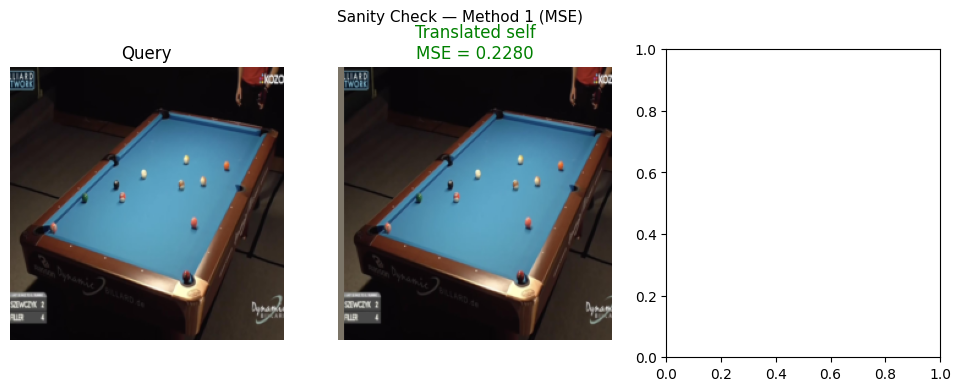

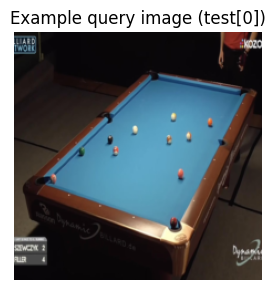

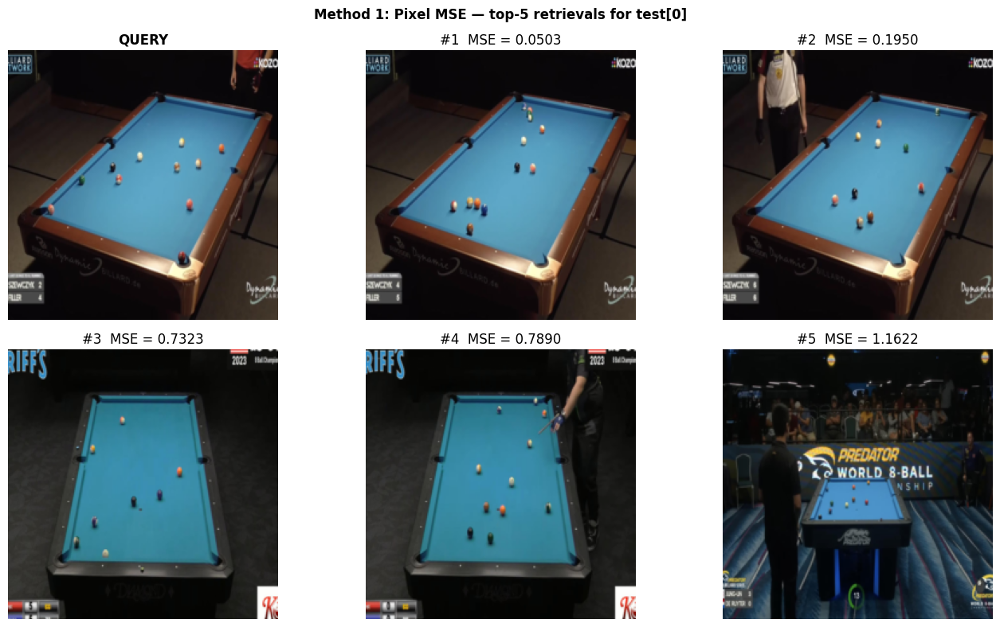

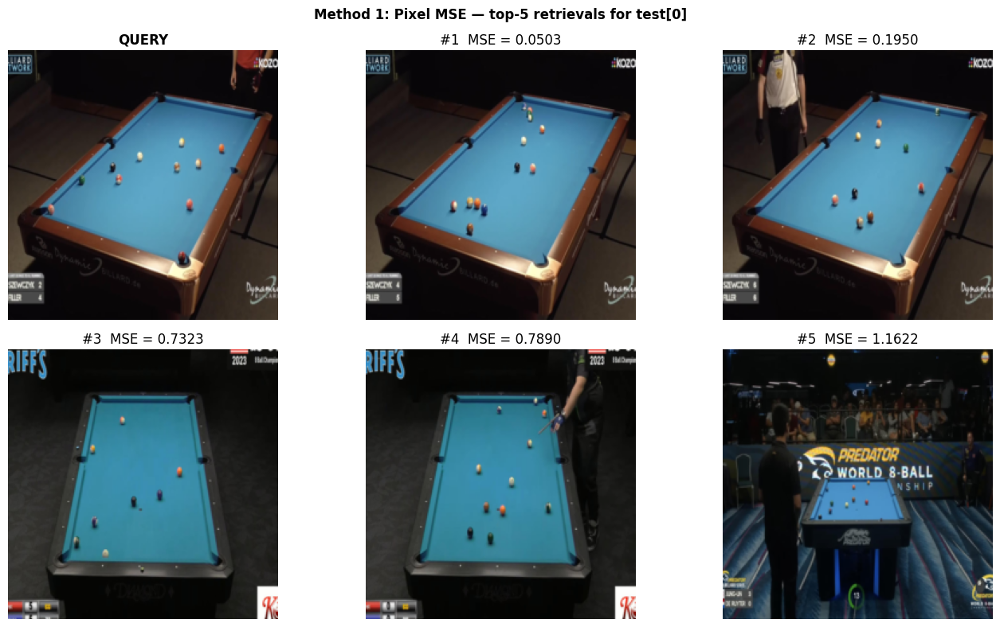

In [51]:
# ── Build MSE similarity scores against the gallery ─────────────────────────
query_image = query_data[0]
query_np    = query_image.numpy()

similarities_mse = np.zeros(len(retrieval_pool))
for i in range(len(retrieval_pool)):
    gallery_np          = retrieval_pool[i].numpy()
    similarities_mse[i] = mean_squared_error(query_np, gallery_np)

top5_idx_mse = np.argsort(similarities_mse)[:5]

# ── Display ─────────────────────────────────────────────────────────────────
f, axarr = plt.subplots(2, 3, figsize=(14, 8))
f.suptitle("Method 1: Pixel MSE — top-5 retrievals for test[0]", fontsize=12, fontweight='bold')

axarr[0][0].imshow(denorm(query_image))
axarr[0][0].set_title("QUERY", fontweight='bold')
axarr[0][0].axis('off')

for j in range(5):
    idx = top5_idx_mse[j]
    ax  = axarr[(j + 1) // 3][(j + 1) % 3]
    ax.imshow(denorm(retrieval_pool[idx]))
    ax.set_title(f"#{j+1}  MSE = {similarities_mse[idx]:.4f}")
    ax.axis('off')

plt.tight_layout()
plt.show()


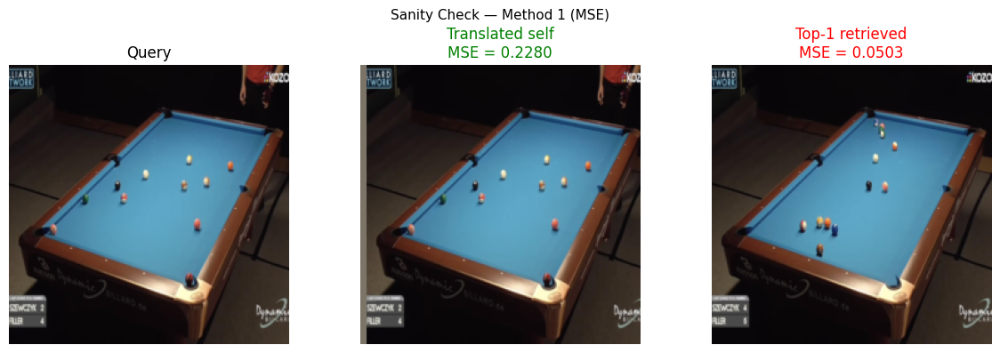

Sanity check ❌ FAILED
  Translation MSE : 0.227978
  Top-1 gallery   : 0.050304

Interpretation: pixel MSE retrieves images with the same camera pose, not the same game state.


In [52]:
# ── Sanity check: query vs translated self vs top-1 retrieved ────────────────

translate_query = TF.affine(
    query_image, angle=0, translate=[5, 0], scale=1.0, shear=[0, 0]
)

sim_trans_mse = mean_squared_error(query_np, translate_query.numpy())
sim_top1_mse  = similarities_mse[top5_idx_mse[0]]

f, axarr = plt.subplots(1, 3, figsize=(12, 4))
f.suptitle("Sanity Check — Method 1 (MSE)", fontsize=11)

axarr[0].imshow(denorm(query_image))
axarr[0].set_title("Query")
axarr[0].axis('off')

axarr[1].imshow(denorm(translate_query))
axarr[1].set_title(f"Translated self\nMSE = {sim_trans_mse:.4f}", color='green')
axarr[1].axis('off')

axarr[2].imshow(denorm(retrieval_pool[top5_idx_mse[0]]))
axarr[2].set_title(f"Top-1 retrieved\nMSE = {sim_top1_mse:.4f}", color='red')
axarr[2].axis('off')

plt.tight_layout()
plt.show()

passed = "✅ PASSED" if sim_trans_mse < sim_top1_mse else "❌ FAILED"
print(f"Sanity check {passed}")
print(f"  Translation MSE : {sim_trans_mse:.6f}")
print(f"  Top-1 gallery   : {sim_top1_mse:.6f}")
print()
print("Interpretation: pixel MSE retrieves images with the same camera pose, not the same game state.")


---
## 12. Method 2: Pretrained ResNet-50 (No Fine-Tuning)




In [53]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Device: {device}")

# ── Frozen pretrained ResNet-50 ──────────────────────────────────────────────
class FeatureExtractor(torch.nn.Module):
    """ResNet-50 backbone with the FC head removed. Output: (B, 2048)."""
    def __init__(self, trainable=False):
        super().__init__()
        backbone = torchvision.models.resnet50(
            weights=torchvision.models.ResNet50_Weights.DEFAULT
        )
        self.encoder = torch.nn.Sequential(*list(backbone.children())[:-1])
        for p in self.encoder.parameters():
            p.requires_grad = trainable

    def forward(self, x):
        return self.encoder(x).flatten(1)

pretrained_model = FeatureExtractor(trainable=False).to(device)
pretrained_model.eval()

# ── Extract features for the whole gallery ───────────────────────────────────
@torch.no_grad()
def build_feature_db(model, dataset):
    feats = []
    for i in range(len(dataset)):
        img  = dataset[i].unsqueeze(0).to(device)
        feat = model(img).squeeze(0).cpu()
        feats.append(feat)
    return torch.stack(feats)

print("Extracting gallery features (pretrained) …")
gallery_feats_pretrained = build_feature_db(pretrained_model, retrieval_pool)
print(f"Done — feature matrix: {tuple(gallery_feats_pretrained.shape)}")


Device: cuda
Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to C:\Users\Ethan/.cache\torch\hub\checkpoints\resnet50-11ad3fa6.pth


100%|██████████| 97.8M/97.8M [00:15<00:00, 6.63MB/s]


Extracting gallery features (pretrained) …
Done — feature matrix: (172, 2048)


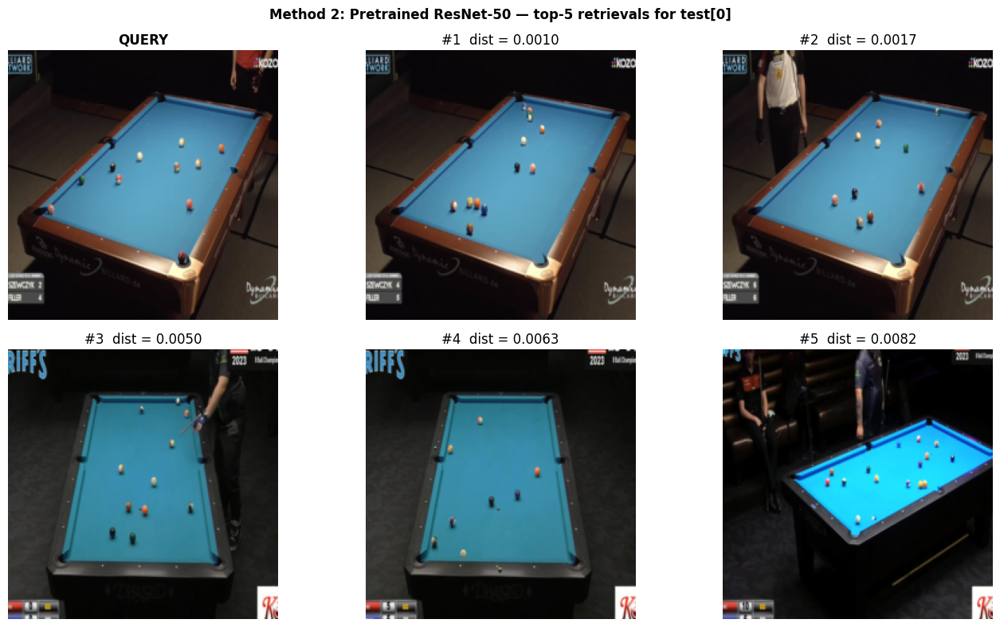

In [54]:
# ── Retrieve top-5 using MSE on pretrained features ──────────────────────────
@torch.no_grad()
def retrieve_top5(query_idx, gallery_feats, model, query_dataset, k=5):
    """Return (top-k indices, distance array) for a query image."""
    q_img  = query_dataset[query_idx].unsqueeze(0).to(device)
    q_feat = model(q_img).squeeze(0).cpu()
    dists  = F.mse_loss(
        q_feat.unsqueeze(0).expand(len(gallery_feats), -1),
        gallery_feats, reduction='none'
    ).mean(dim=1).numpy()
    return np.argsort(dists)[:k], dists

top5_idx_pre, dists_pre = retrieve_top5(0, gallery_feats_pretrained, pretrained_model, query_data)

f, axarr = plt.subplots(2, 3, figsize=(14, 8))
f.suptitle("Method 2: Pretrained ResNet-50 — top-5 retrievals for test[0]", fontsize=12, fontweight='bold')

axarr[0][0].imshow(denorm(query_data[0]))
axarr[0][0].set_title("QUERY", fontweight='bold')
axarr[0][0].axis('off')

for j in range(5):
    idx = top5_idx_pre[j]
    ax  = axarr[(j + 1) // 3][(j + 1) % 3]
    ax.imshow(denorm(retrieval_pool[idx]))
    ax.set_title(f"#{j+1}  dist = {dists_pre[idx]:.4f}")
    ax.axis('off')

plt.tight_layout()
plt.show()


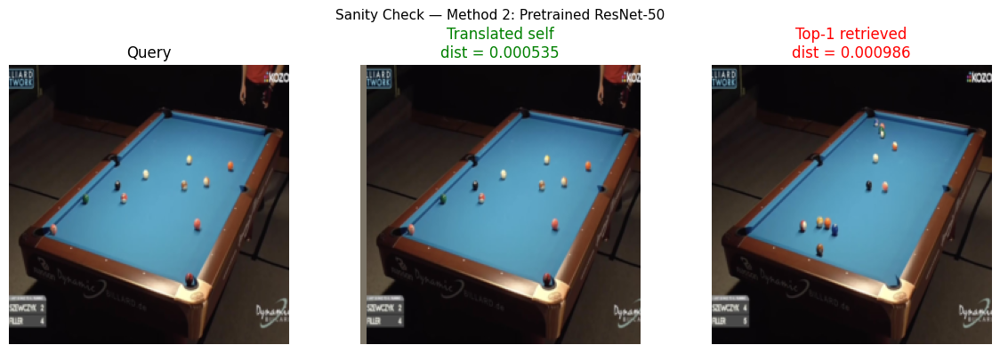

  ✅ PASSED  |  Translation: 0.000535  |  Top-1 gallery: 0.000986


np.True_

In [55]:
# ── Sanity check — pretrained ResNet ────────────────────────────────────────
@torch.no_grad()
def sanity_check(query_idx, gallery_feats, model, query_dataset, method_name):
    q_img    = query_dataset[query_idx]
    q_moved  = TF.affine(q_img, angle=0, translate=[5, 0], scale=1.0, shear=[0, 0])

    q_feat   = model(q_img.unsqueeze(0).to(device)).squeeze(0).cpu()
    m_feat   = model(q_moved.unsqueeze(0).to(device)).squeeze(0).cpu()

    top1_idx, dists = retrieve_top5(query_idx, gallery_feats, model, query_dataset, k=1)
    sim_trans  = F.mse_loss(q_feat, m_feat).item()
    sim_top1   = dists[top1_idx[0]]

    f, axarr = plt.subplots(1, 3, figsize=(12, 4))
    f.suptitle(f"Sanity Check — {method_name}", fontsize=11)

    axarr[0].imshow(denorm(q_img))
    axarr[0].set_title("Query")
    axarr[0].axis('off')
    axarr[1].imshow(denorm(q_moved))
    axarr[1].set_title(f"Translated self\ndist = {sim_trans:.6f}", color='green')
    axarr[1].axis('off')
    axarr[2].imshow(denorm(retrieval_pool[top1_idx[0]]))
    axarr[2].set_title(f"Top-1 retrieved\ndist = {sim_top1:.6f}", color='red')
    axarr[2].axis('off')

    plt.tight_layout()
    plt.show()

    status = "✅ PASSED" if sim_trans < sim_top1 else "❌ FAILED"
    print(f"  {status}  |  Translation: {sim_trans:.6f}  |  Top-1 gallery: {sim_top1:.6f}")
    return sim_trans < sim_top1

sanity_check(0, gallery_feats_pretrained, pretrained_model, query_data, "Method 2: Pretrained ResNet-50")


---
## 13. Method 3: Contrastive Learning with Multi-View Positive Pairs

#

### Contrastive Learning Strategy

We train the ResNet-50 backbone with a **triplet loss**:

| Sample | Meaning |
|--------|---------|
| **Query** | An anchor training image (no augmentation) |
| **Positive** | Another view of the same table (a/t/f sibling), or an augmented version if no sibling exists |
| **Negative** | An image from a *different* table (always different table ID) |




In [56]:
# ── Helper: extract table ID from filename ───────────────────────────────────
def get_table_id(filename):
    """
    '10a_png.rf.xxx.jpg' → '10'   (strip trailing a/t/f view indicator)
    '10_png.rf.xxx.jpg'  → '10'   (no suffix, base table)
    '0_png.rf.xxx.jpg'   → '0'
    """
    base = filename.split('_png')[0]
    return re.sub(r'[atf]$', '', base)

# ── Verify this parsing assumption against YOUR actual filenames ────────────
sample_names = pd.read_csv(PARTITION_CSV)['image_name'].head(5).tolist()
print("Sample filenames:", sample_names)
print("Parsed table IDs:", [get_table_id(n) for n in sample_names])

# ── Triplet Dataset ───────────────────────────────────────────────────────────
class TripletPoolDataset(Dataset):
    """
    Returns (query, positive, negative) triplets.
    Positive = a real multi-view sibling image if one exists in the split,
               otherwise an augmented version of the same image.
    Negative = an image from a definitively different table ID.
    """
    def __init__(self, partition_csv, partition, transform, val_transform):
        df         = pd.read_csv(partition_csv)
        mask       = df['partition'] == partition
        self.files = df.loc[mask, 'image_name'].values
        self.transform     = transform
        self.val_transform = val_transform

        self.table_to_idx = defaultdict(list)
        for i, fname in enumerate(self.files):
            tid = get_table_id(fname)
            self.table_to_idx[tid].append(i)

        self.table_ids = list(self.table_to_idx.keys())

    def __len__(self):
        return len(self.files)

    def __getitem__(self, i):
        fname    = self.files[i]
        table_id = get_table_id(fname)
        img      = Image.open(file_index[fname]).convert('RGB')

        # ── Query: no augmentation (standard val transform)
        image_query = self.val_transform(img)

        # ── Positive: real multi-view sibling if available, else augment
        siblings = [j for j in self.table_to_idx[table_id] if j != i]
        if siblings:
            pos_fname = self.files[random.choice(siblings)]
            pos_img   = Image.open(file_index[pos_fname]).convert('RGB')
            image_pos = self.val_transform(pos_img)
        else:
            image_pos = self.transform(img)

        # ── Negative: random image from a different table
        other_tables = [t for t in self.table_ids if t != table_id]
        neg_table    = random.choice(other_tables)
        neg_idx      = random.choice(self.table_to_idx[neg_table])
        neg_fname    = self.files[neg_idx]
        neg_img      = Image.open(file_index[neg_fname]).convert('RGB')
        image_neg    = self.val_transform(neg_img)

        return image_query, image_pos, image_neg

# ── Quick sanity: how many tables have multiple views? ──────────────────────
df_all   = pd.read_csv(PARTITION_CSV)
all_ids  = df_all['image_name'].apply(get_table_id)
id_counts = all_ids.value_counts()
multi    = (id_counts > 1).sum()
print(f"Total unique table IDs : {len(id_counts)}")
print(f"Tables with 2+ views   : {multi} ({100*multi/len(id_counts):.0f}%)")
print(f"Example multi-view IDs : {id_counts[id_counts > 1].head(5).to_dict()}")


Sample filenames: ['0_png.rf.e35063c144cfd241454863d624cf01d3.jpg', '101_png.rf.ae5f060fc5ed9e0adfaf2ffa7d786c67.jpg', '102_png.rf.e106f609270b206b301a09b5c5473e95.jpg', '105_png.rf.ea359f2dfa667da92e30a8ceeefe7e62.jpg', '106_png.rf.28ee53acf89d9e7f17b2fb26185597a0.jpg']
Parsed table IDs: ['0', '101', '102', '105', '106']
Total unique table IDs : 195
Tables with 2+ views   : 25 (13%)
Example multi-view IDs : {'21': 4, '7': 4, '10': 3, '11': 3, '12': 3}


In [60]:
# ── Build datasets and dataloaders for contrastive training ─────────────────
train_triplet = TripletPoolDataset(PARTITION_CSV, 'train', aug_transform, val_transform)
val_triplet   = TripletPoolDataset(PARTITION_CSV, 'valid', aug_transform, val_transform)

BATCH_SIZE  = 8
NUM_WORKERS = 0

train_loader = DataLoader(train_triplet, BATCH_SIZE, shuffle=True,  num_workers=NUM_WORKERS)
val_loader   = DataLoader(val_triplet,   BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS)

print(f"Train triplets : {len(train_triplet)}  ({len(train_loader)} batches)")
print(f"Val   triplets : {len(val_triplet)}  ({len(val_loader)} batches)")


Train triplets : 172  (22 batches)
Val   triplets : 37  (5 batches)


Starting contrastive training …
Epoch  1/20 — train loss: 0.9730  val loss: 0.9077
Epoch  2/20 — train loss: 0.8138  val loss: 0.6009
Epoch  3/20 — train loss: 0.6425  val loss: 0.6011
Epoch  4/20 — train loss: 0.5775  val loss: 0.5711
Epoch  5/20 — train loss: 0.4953  val loss: 0.6094
Epoch  6/20 — train loss: 0.4156  val loss: 0.4832
Epoch  7/20 — train loss: 0.4643  val loss: 0.3890
Epoch  8/20 — train loss: 0.3922  val loss: 0.5164
Epoch  9/20 — train loss: 0.3596  val loss: 0.4457
Epoch 10/20 — train loss: 0.3494  val loss: 0.2736
Epoch 11/20 — train loss: 0.3704  val loss: 0.4526
Epoch 12/20 — train loss: 0.3553  val loss: 0.5235
Epoch 13/20 — train loss: 0.2659  val loss: 0.6296
Epoch 14/20 — train loss: 0.3346  val loss: 0.4715
Epoch 15/20 — train loss: 0.2312  val loss: 0.5437
Epoch 16/20 — train loss: 0.2696  val loss: 0.5433
Epoch 17/20 — train loss: 0.2700  val loss: 0.6917
Epoch 18/20 — train loss: 0.2216  val loss: 0.5592
Epoch 19/20 — train loss: 0.2074  val loss: 0.6046

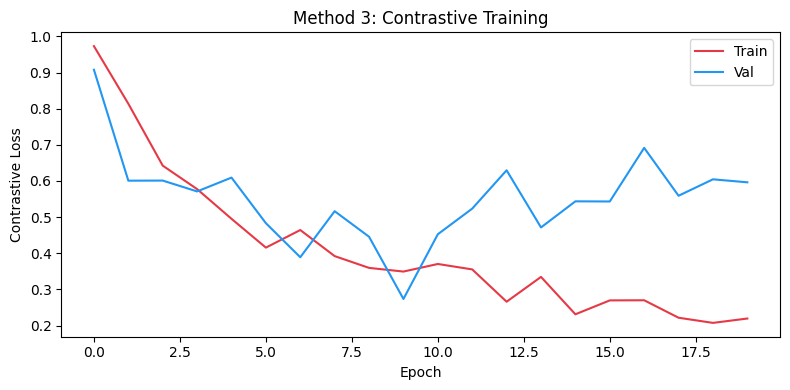

In [61]:
# ── Contrastive Feature Extractor (trainable) ───────────────────────────────
contrastive_model = FeatureExtractor(trainable=True).to(device)

optimizer  = torch.optim.AdamW(contrastive_model.parameters(), lr=1e-4, weight_decay=1e-4)
loss_pixel = torch.nn.MSELoss(reduction='none')
MARGIN     = 1.0
EPOCHS     = 20

def one_epoch_contrastive(model, optimizer, dataloader, is_training):
    """One pass of triplet contrastive loss (MSE-based)."""
    model.train() if is_training else model.eval()
    avg_loss = 0.0
    ctx = torch.enable_grad() if is_training else torch.no_grad()
    with ctx:
        for img_q, img_p, img_n in dataloader:
            img_q = img_q.to(device)
            img_p = img_p.to(device)
            img_n = img_n.to(device)

            rep_q = model(img_q)
            rep_p = model(img_p)
            rep_n = model(img_n)

            loss = loss_pixel(rep_q, rep_p).mean()
            neg_dist = loss_pixel(rep_q, rep_n).mean(dim=1)
            loss += torch.mean(torch.clamp(MARGIN - neg_dist, min=0))

            if is_training:
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()

            avg_loss += loss.item() / len(dataloader)
    return avg_loss

print("Starting contrastive training …")
train_losses, val_losses = [], []

for epoch in range(EPOCHS):
    tr_loss = one_epoch_contrastive(contrastive_model, optimizer, train_loader, True)
    vl_loss = one_epoch_contrastive(contrastive_model, optimizer, val_loader,   False)
    train_losses.append(tr_loss)
    val_losses.append(vl_loss)
    print(f"Epoch {epoch+1:2d}/{EPOCHS} — train loss: {tr_loss:.4f}  val loss: {vl_loss:.4f}")

# ── Plot training curves ────────────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(8, 4))
ax.plot(train_losses, label='Train', color='#e63946')
ax.plot(val_losses,   label='Val',   color='#2196f3')
ax.set_xlabel('Epoch')
ax.set_ylabel('Contrastive Loss')
ax.set_title('Method 3: Contrastive Training')
ax.legend()
plt.tight_layout()
plt.show()


Extracting gallery features (contrastive model) …
Done — feature matrix: (172, 2048)


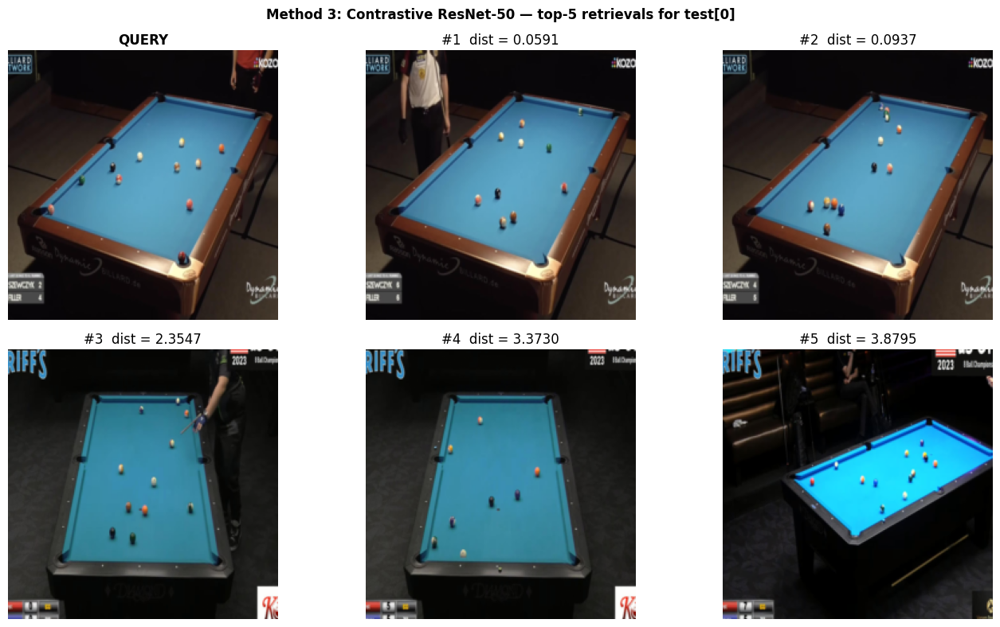

In [62]:
# ── Build gallery features with the contrastive model ───────────────────────
print("Extracting gallery features (contrastive model) …")
gallery_feats_contrastive = build_feature_db(contrastive_model, retrieval_pool)
print(f"Done — feature matrix: {tuple(gallery_feats_contrastive.shape)}")

# ── Retrieve top-5 for the same example query ────────────────────────────────
top5_idx_ctr, dists_ctr = retrieve_top5(0, gallery_feats_contrastive,
                                         contrastive_model, query_data)

f, axarr = plt.subplots(2, 3, figsize=(14, 8))
f.suptitle("Method 3: Contrastive ResNet-50 — top-5 retrievals for test[0]",
           fontsize=12, fontweight='bold')

axarr[0][0].imshow(denorm(query_data[0]))
axarr[0][0].set_title("QUERY", fontweight='bold')
axarr[0][0].axis('off')

for j in range(5):
    idx = top5_idx_ctr[j]
    ax  = axarr[(j + 1) // 3][(j + 1) % 3]
    ax.imshow(denorm(retrieval_pool[idx]))
    ax.set_title(f"#{j+1}  dist = {dists_ctr[idx]:.4f}")
    ax.axis('off')

plt.tight_layout()
plt.show()


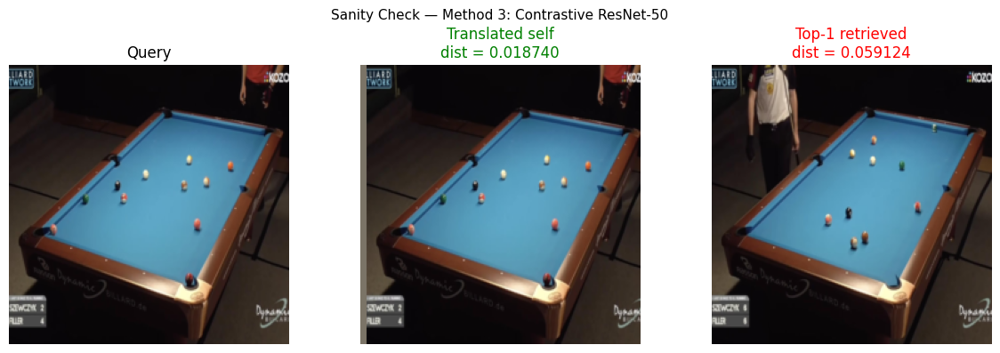

  ✅ PASSED  |  Translation: 0.018740  |  Top-1 gallery: 0.059124


np.True_

In [63]:
# ── Sanity check — contrastive model ────────────────────────────────────────
sanity_check(0, gallery_feats_contrastive, contrastive_model, query_data,
             "Method 3: Contrastive ResNet-50")


---
## 14. Qualitative Evaluation

We run all three methods on the full test set and display results side by side.  
Layout per query:
- **Row 0:** Method 1 (pixel MSE)
- **Row 1:** Method 2 (pretrained ResNet-50)
- **Row 2:** Method 3 (contrastive ResNet-50)

Red/orange/blue borders distinguish the methods.


Showing retrieval results for 5 query images …



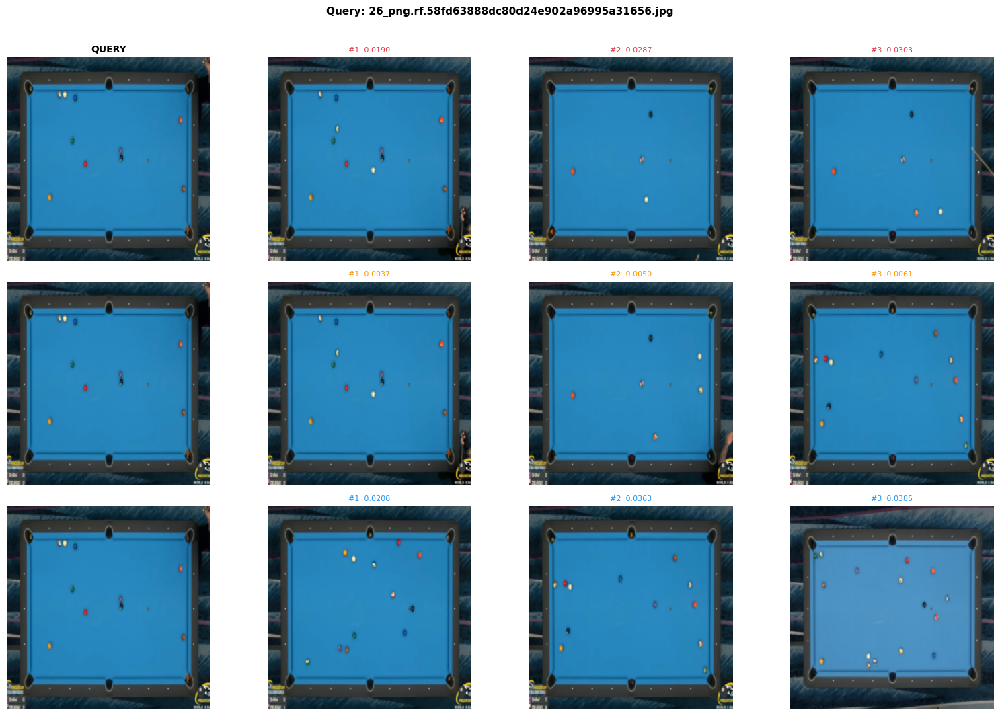

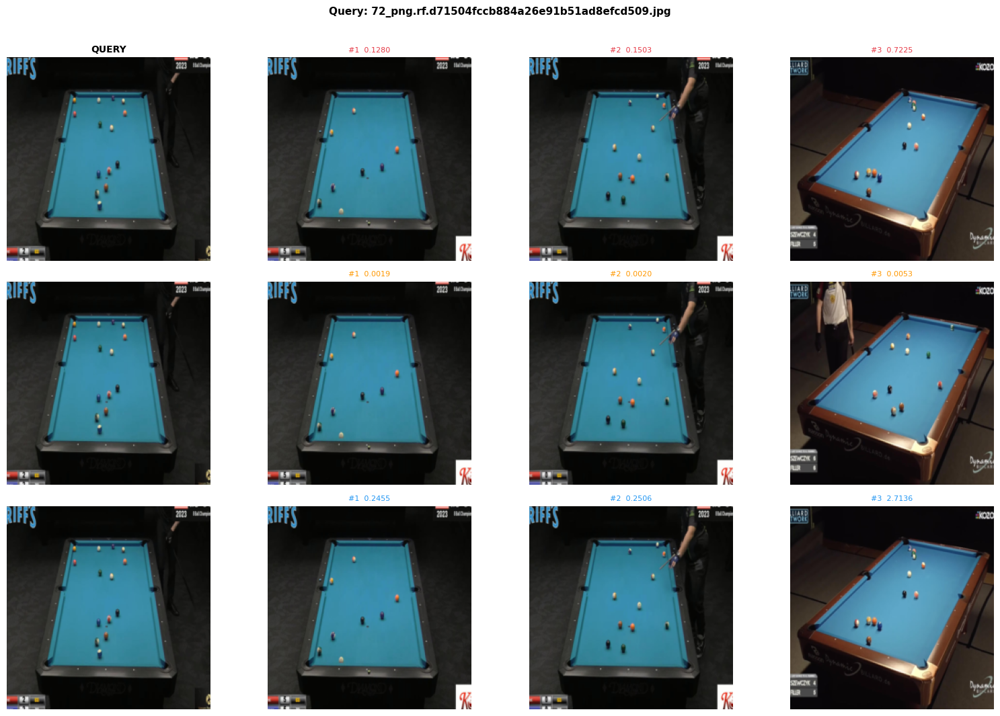

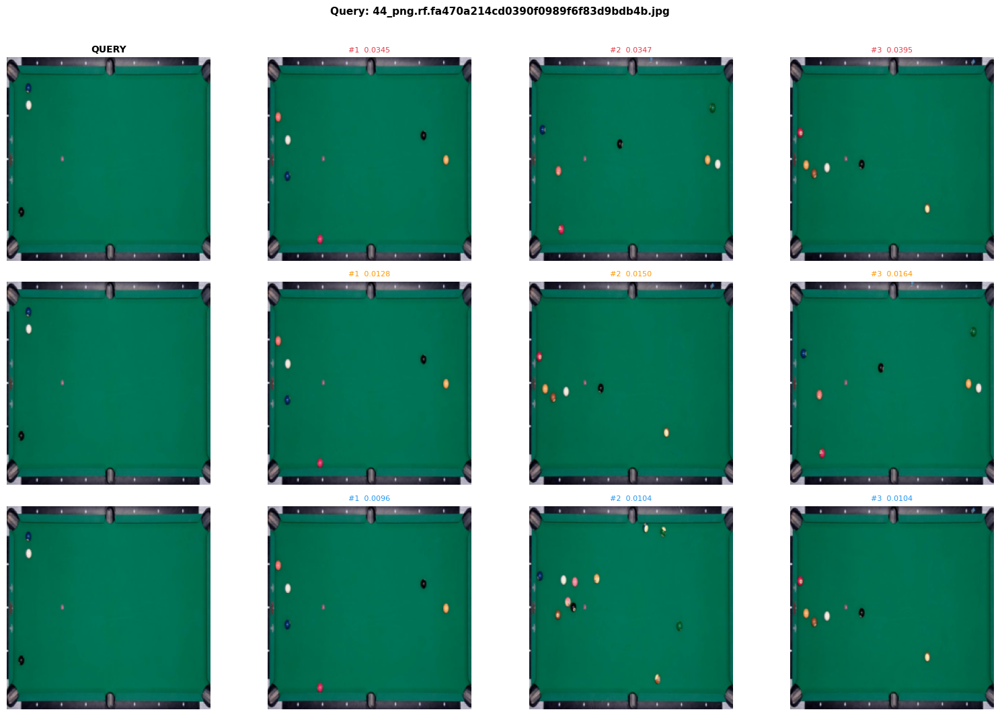

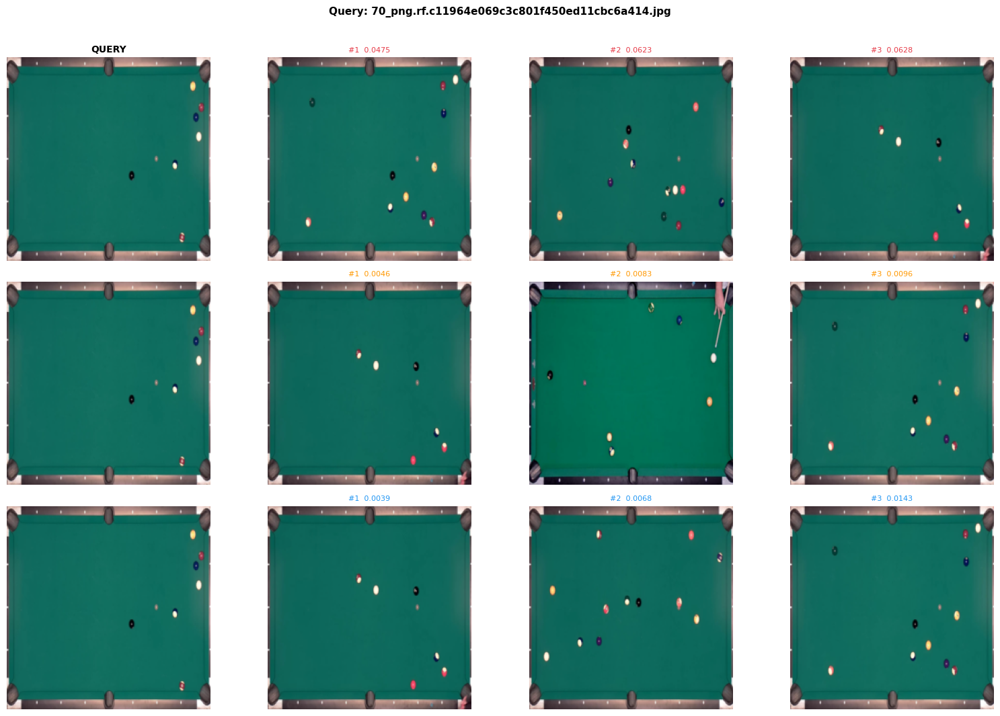

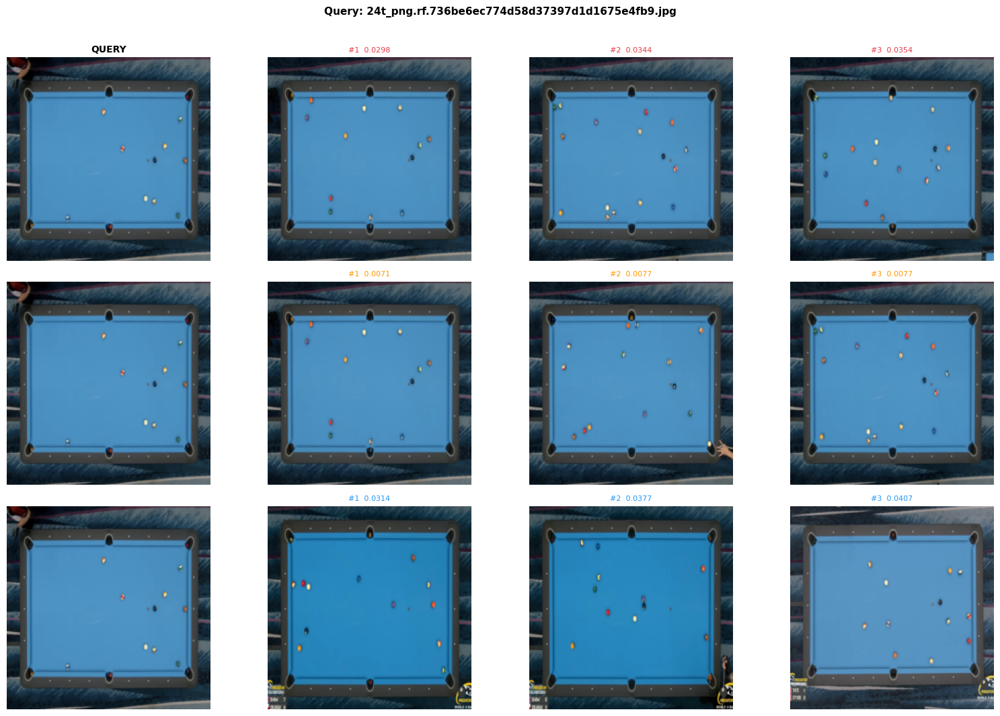

In [64]:
def show_three_method_comparison(query_idx, n_results=3):
    """
    Display top-n_results for all three methods for one query image.
    """
    q_img    = query_data[query_idx]
    q_np     = q_img.numpy()

    # ── Method 1 (MSE pixel) ──────────────────────────────────────────
    dists_m1 = np.array([
        mean_squared_error(q_np, retrieval_pool[i].numpy())
        for i in range(len(retrieval_pool))
    ])
    top_m1 = np.argsort(dists_m1)[:n_results]

    # ── Method 2 (pretrained) ─────────────────────────────────────────
    top_m2, dists_m2 = retrieve_top5(query_idx, gallery_feats_pretrained,
                                      pretrained_model, query_data, k=n_results)

    # ── Method 3 (contrastive) ────────────────────────────────────────
    top_m3, dists_m3 = retrieve_top5(query_idx, gallery_feats_contrastive,
                                      contrastive_model, query_data, k=n_results)

    # ── Plot ──────────────────────────────────────────────────────────
    n_rows, n_cols = 3, n_results + 1
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(4 * n_cols, 3.5 * n_rows))
    fname = query_data.files[query_idx]
    fig.suptitle(f"Query: {fname}", fontsize=11, fontweight='bold', y=1.01)

    methods   = ['M1: Pixel MSE', 'M2: Pretrained', 'M3: Contrastive']
    top_lists = [top_m1, top_m2, top_m3]
    dist_maps = [dists_m1, dists_m2, dists_m3]
    colors    = ['#e63946', '#ff9800', '#2196f3']

    for row, (mname, tops, dists, color) in enumerate(
            zip(methods, top_lists, dist_maps, colors)):
        axes[row, 0].imshow(denorm(q_img))
        axes[row, 0].set_ylabel(mname, fontsize=9)
        if row == 0:
            axes[row, 0].set_title("QUERY", fontweight='bold', fontsize=10)
        axes[row, 0].axis('off')

        for col, idx in enumerate(tops):
            ax = axes[row, col + 1]
            ax.imshow(denorm(retrieval_pool[idx]))
            ax.set_title(f"#{col+1}  {dists[idx]:.4f}", fontsize=8, color=color)
            ax.axis('off')
            for spine in ax.spines.values():
                spine.set_visible(True)
                spine.set_edgecolor(color)
                spine.set_linewidth(2.5)

    plt.tight_layout()
    plt.show()

# ── Run for 5 random test images ─────────────────────────────────────────────
N_SHOW = min(5, len(query_data))
chosen = random.sample(range(len(query_data)), N_SHOW)

print(f"Showing retrieval results for {N_SHOW} query images …\n")
for qi in chosen:
    show_three_method_comparison(qi, n_results=3)


In [67]:
# ── Print final summary ──────────────────────────────────────────────────────
print("=" * 60)
print("  TASK 3B — TABLE RETRIEVAL — FINAL SUMMARY")
print("=" * 60)
print(f"\n  Gallery size : {len(retrieval_pool)} images  (train partition)")
print(f"  Query count  : {len(query_data)} images  (test partition)")

df_part = pd.read_csv(PARTITION_CSV)
n_multi = (df_part['image_name'].apply(get_table_id).value_counts() > 1).sum()
print(f"  Multi-view tables (a/t/f) used as positives: {n_multi}")

print("\n  Sanity check pass rate:")
for name, passed in results.items():
    rate = 100 * sum(passed) / len(passed)
    print(f"    {name:20s}: {rate:.0f}%")

print("\n" + "=" * 60)


  TASK 3B — TABLE RETRIEVAL — FINAL SUMMARY

  Gallery size : 172 images  (train partition)
  Query count  : 38 images  (test partition)
  Multi-view tables (a/t/f) used as positives: 25

  Sanity check pass rate:
    M1_pixel            : 20%
    M2_pretrained       : 96%
    M3_contrastive      : 52%

